In [1]:
import matplotlib as mpl
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
from datetime import datetime

mpl.rcParams['figure.figsize'] = (8,6)
mpl.rcParams['axes.grid'] = False

In [2]:
df = pd.read_csv('ED_PatientCount.csv')

In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 39838 entries, 0 to 39837
Data columns (total 3 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   Date         39838 non-null  object 
 1   Hour         39838 non-null  int64  
 2   ED_Patients  39831 non-null  float64
dtypes: float64(1), int64(1), object(1)
memory usage: 933.8+ KB


In [4]:
df

,Date,Hour,ED_Patients
0,6/29/2018,0,23.0
1,6/29/2018,1,20.0
2,6/29/2018,2,16.0
3,6/29/2018,3,6.0
4,6/29/2018,4,4.0
...,...,...,...
39833,1/26/2023,5,16.0
39834,1/26/2023,6,19.0
39835,1/26/2023,7,16.0
39836,1/26/2023,8,21.0


In [5]:
df = pd.read_csv('ED_PatientCount.csv',
                 parse_dates= {"date_hour" : ["Date","Hour"]},
                 keep_date_col=True)

In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 39838 entries, 0 to 39837
Data columns (total 4 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   date_hour    39838 non-null  object 
 1   Date         39838 non-null  object 
 2   Hour         39838 non-null  object 
 3   ED_Patients  39831 non-null  float64
dtypes: float64(1), object(3)
memory usage: 1.2+ MB


In [7]:
df

,date_hour,Date,Hour,ED_Patients
0,6/29/2018 0,6/29/2018,0,23.0
1,6/29/2018 1,6/29/2018,1,20.0
2,6/29/2018 2,6/29/2018,2,16.0
3,6/29/2018 3,6/29/2018,3,6.0
4,6/29/2018 4,6/29/2018,4,4.0
...,...,...,...,...
39833,1/26/2023 5,1/26/2023,5,16.0
39834,1/26/2023 6,1/26/2023,6,19.0
39835,1/26/2023 7,1/26/2023,7,16.0
39836,1/26/2023 8,1/26/2023,8,21.0


In [8]:
df['date_hour']=pd.to_datetime(df.date_hour, format="%m/%d/%Y %H")
df['Date']=pd.to_datetime(df.Date, format="%m/%d/%Y")
df['Hour']=pd.to_numeric(df.Hour)

In [9]:
df

,date_hour,Date,Hour,ED_Patients
0,2018-06-29 00:00:00,2018-06-29,0,23.0
1,2018-06-29 01:00:00,2018-06-29,1,20.0
2,2018-06-29 02:00:00,2018-06-29,2,16.0
3,2018-06-29 03:00:00,2018-06-29,3,6.0
4,2018-06-29 04:00:00,2018-06-29,4,4.0
...,...,...,...,...
39833,2023-01-26 05:00:00,2023-01-26,5,16.0
39834,2023-01-26 06:00:00,2023-01-26,6,19.0
39835,2023-01-26 07:00:00,2023-01-26,7,16.0
39836,2023-01-26 08:00:00,2023-01-26,8,21.0


In [10]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 39838 entries, 0 to 39837
Data columns (total 4 columns):
 #   Column       Non-Null Count  Dtype         
---  ------       --------------  -----         
 0   date_hour    39838 non-null  datetime64[ns]
 1   Date         39838 non-null  datetime64[ns]
 2   Hour         39838 non-null  int64         
 3   ED_Patients  39831 non-null  float64       
dtypes: datetime64[ns](2), float64(1), int64(1)
memory usage: 1.2 MB


In [11]:
erv_df_unindexed = df.copy()
erv_df = df.copy().set_index('date_hour')

In [12]:
erv_df

,Date,Hour,ED_Patients
date_hour,,,
2018-06-29 00:00:00,2018-06-29,0,23.0
2018-06-29 01:00:00,2018-06-29,1,20.0
2018-06-29 02:00:00,2018-06-29,2,16.0
2018-06-29 03:00:00,2018-06-29,3,6.0
2018-06-29 04:00:00,2018-06-29,4,4.0
...,...,...,...
2023-01-26 05:00:00,2023-01-26,5,16.0
2023-01-26 06:00:00,2023-01-26,6,19.0
2023-01-26 07:00:00,2023-01-26,7,16.0


In [13]:
erv_df.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 39838 entries, 2018-06-29 00:00:00 to 2023-01-26 09:00:00
Data columns (total 3 columns):
 #   Column       Non-Null Count  Dtype         
---  ------       --------------  -----         
 0   Date         39838 non-null  datetime64[ns]
 1   Hour         39838 non-null  int64         
 2   ED_Patients  39831 non-null  float64       
dtypes: datetime64[ns](1), float64(1), int64(1)
memory usage: 1.2 MB


In [14]:
print("Rows   : ", erv_df.shape[0])
print("Columns: ", erv_df.shape[1])
print("\nFeatures:  \n", erv_df.columns.tolist())
print("\nMissing values:    ", erv_df.isnull().any())
print("\nUnique values:    ", erv_df.nunique())

Rows   :  39838
Columns:  3

Features:  
 ['Date', 'Hour', 'ED_Patients']

Missing values:     Date           False
Hour           False
ED_Patients     True
dtype: bool

Unique values:     Date           1672
Hour             24
ED_Patients      93
dtype: int64


<AxesSubplot: xlabel='date_hour'>

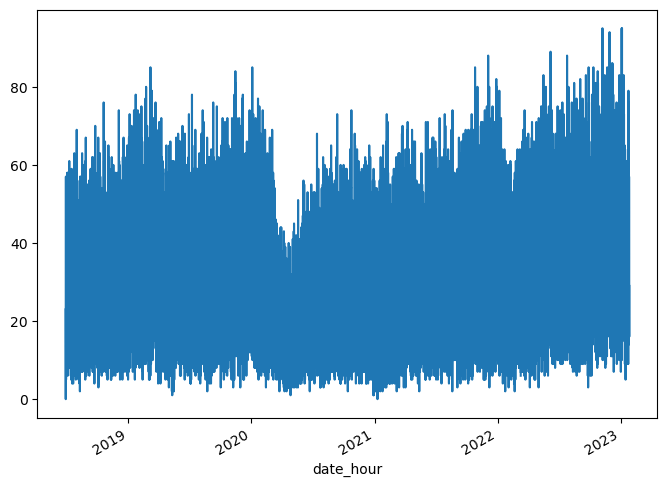

In [15]:
erv_df['ED_Patients'].plot()

In [16]:
import plotly.express as px

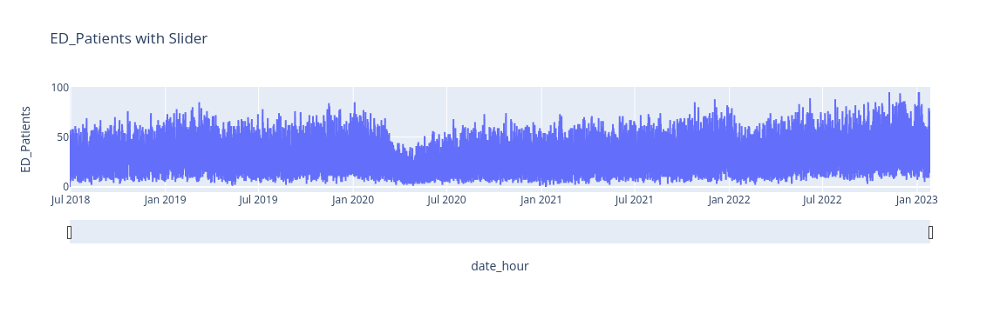

In [17]:
fig = px.line(erv_df_unindexed,
              x='date_hour',
              y='ED_Patients',
              title='ED_Patients with Slider')

fig.update_xaxes(rangeslider_visible=True)
fig.show()

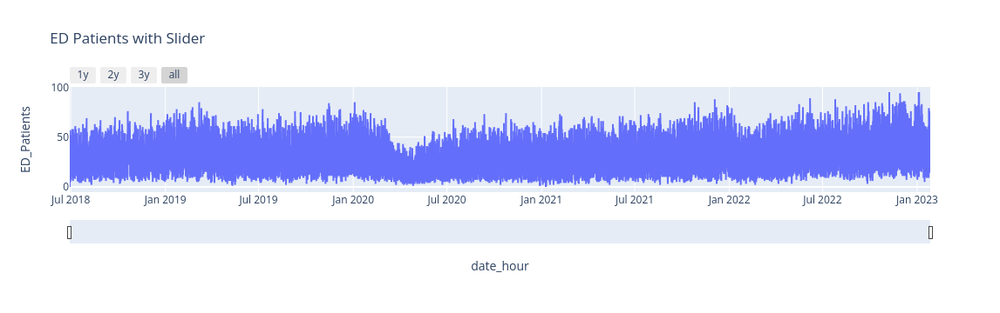

In [18]:
fig = px.line(erv_df_unindexed,
              x='date_hour',
              y='ED_Patients',
              title='ED Patients with Slider')

fig.update_xaxes(
  rangeslider_visible=True,
  rangeselector=dict(
    buttons=list([
      dict(count=1, label="1y", step="year", stepmode="backward"),
      dict(count=2, label="2y", step="year", stepmode="backward"),
      dict(count=3, label="3y", step="year", stepmode="backward"),
      dict(step="all")
    ])
  )
)
fig.show()

In [19]:
df_2021 = erv_df.loc['2021'].reset_index()
df_2022 = erv_df.loc['2022'].reset_index()

Text(0.5, 1.0, 'Patients for 2021 and 2022')

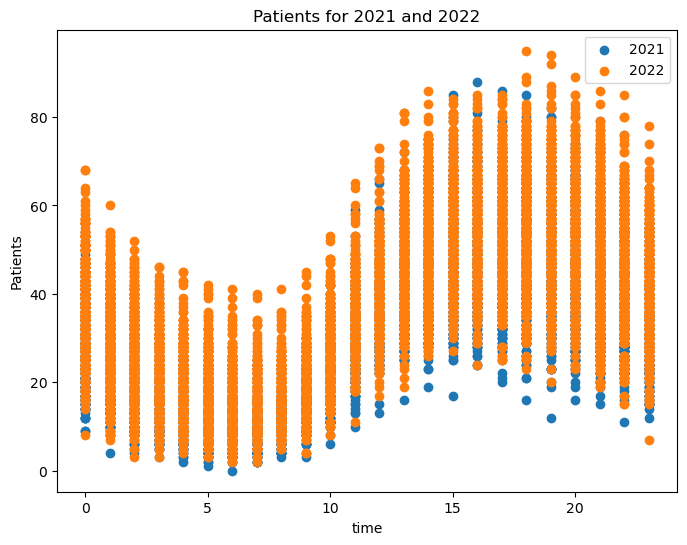

In [20]:
plt.scatter(df_2021['Hour'], df_2021['ED_Patients'])
plt.scatter(df_2022['Hour'], df_2022['ED_Patients'])
plt.legend(['2021', '2022'])
plt.xlabel('time')
plt.ylabel('Patients')
plt.title('Patients for 2021 and 2022')

<AxesSubplot: ylabel='Density'>

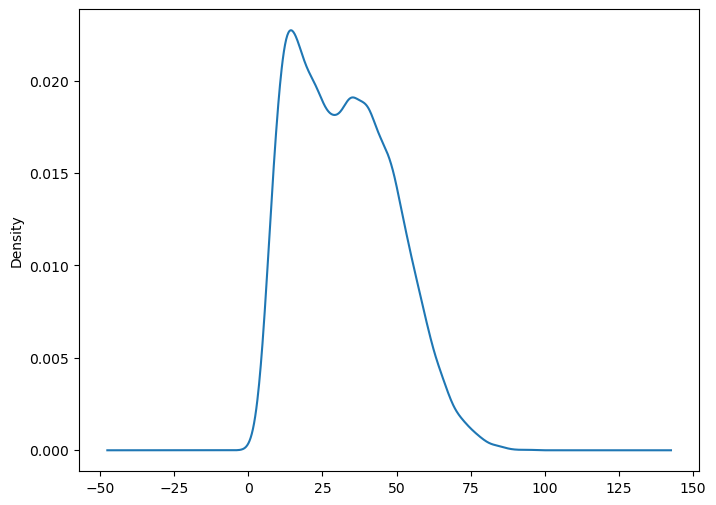

In [21]:
erv_df['ED_Patients'].plot(kind='density')

<AxesSubplot: xlabel='y(t)', ylabel='y(t + 1)'>

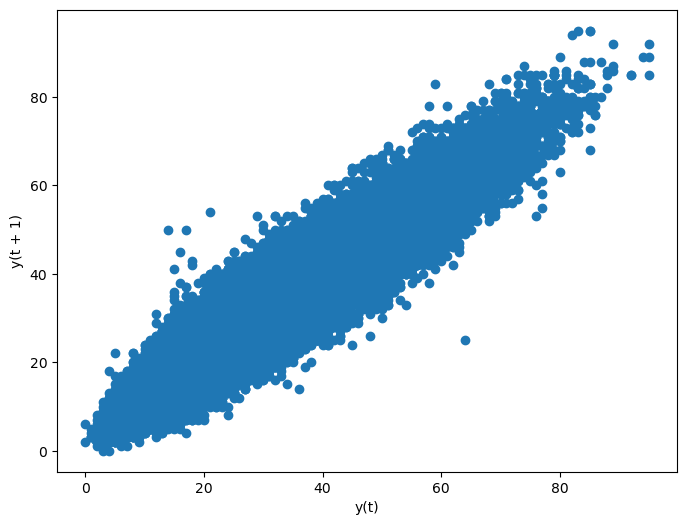

In [22]:
pd.plotting.lag_plot(erv_df['ED_Patients'],lag=1)

<AxesSubplot: xlabel='y(t)', ylabel='y(t + 12)'>

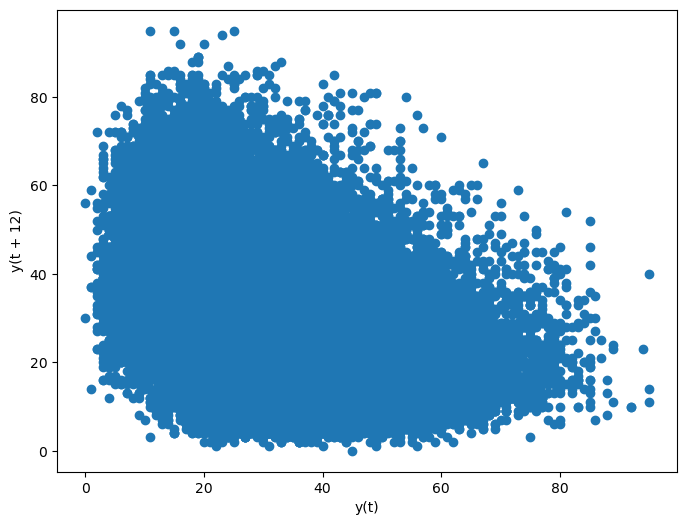

In [23]:
pd.plotting.lag_plot(erv_df['ED_Patients'],lag=12)

<AxesSubplot: xlabel='y(t)', ylabel='y(t + 24)'>

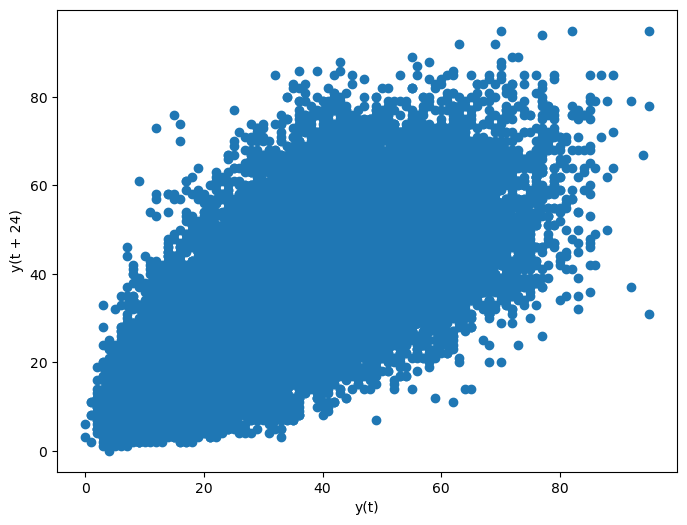

In [24]:
pd.plotting.lag_plot(erv_df['ED_Patients'],lag=24)

<AxesSubplot: xlabel='y(t)', ylabel='y(t + 8760)'>

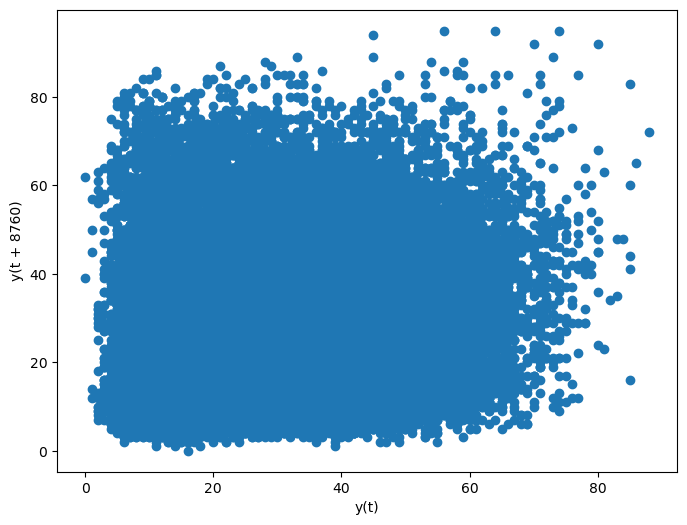

In [25]:
pd.plotting.lag_plot(erv_df['ED_Patients'],lag=8760)

In [26]:
erv_df.query('ED_Patients != ED_Patients')

,Date,Hour,ED_Patients
date_hour,,,
2021-12-27 11:00:00,2021-12-27,11,NaN
2022-02-04 11:00:00,2022-02-04,11,NaN
2022-02-16 10:00:00,2022-02-16,10,NaN
2022-02-18 08:00:00,2022-02-18,8,NaN
2022-02-22 09:00:00,2022-02-22,9,NaN
2022-02-22 14:00:00,2022-02-22,14,NaN
2022-03-10 05:00:00,2022-03-10,5,NaN


In [27]:
erv_df['ED_Patients']=erv_df['ED_Patients'].fillna(method='ffill')

In [28]:
print("Rows   : ", erv_df.shape[0])
print("Columns: ", erv_df.shape[1])
print("\nFeatures:  \n", erv_df.columns.tolist())
print("\nMissing values:    ", erv_df.isnull().any())
print("\nUnique values:    ", erv_df.nunique())

Rows   :  39838
Columns:  3

Features:  
 ['Date', 'Hour', 'ED_Patients']

Missing values:     Date           False
Hour           False
ED_Patients    False
dtype: bool

Unique values:     Date           1672
Hour             24
ED_Patients      93
dtype: int64


In [29]:
erv_df.describe()

,Hour,ED_Patients
count,39838.000000,39838.000000
mean,11.527085,32.198479
std,6.923401,16.625352
min,0.000000,0.000000
25%,6.000000,18.000000
50%,12.000000,31.000000
75%,18.000000,44.000000
max,23.000000,95.000000


In [30]:
erv_df.index.dtype

dtype('<M8[ns]')

In [31]:
erv_df_unindexed.index.dtype
erv_df.Hour.dtype

dtype('int64')

/tmp/ipykernel_52898/73357762.py:1: FutureWarning:

The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.



<AxesSubplot: title={'center': 'Vists Per Hour'}, xlabel='Hour'>

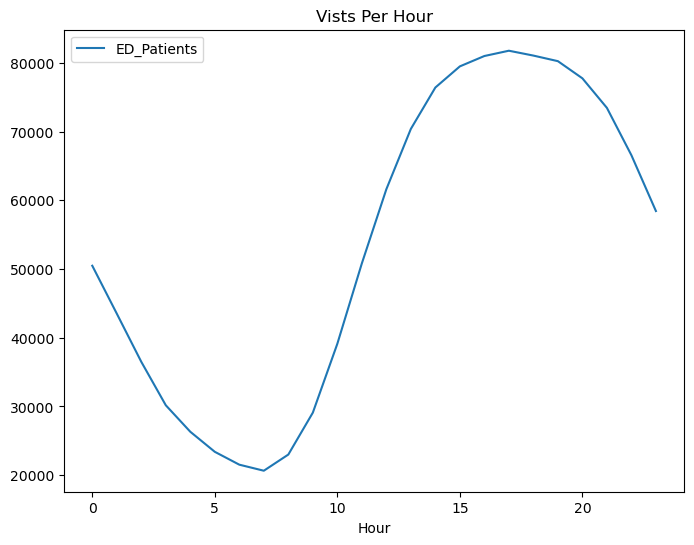

In [32]:
erv_by_day = erv_df.groupby('Hour').sum()
erv_by_day.plot(title='Vists Per Hour')

<AxesSubplot: xlabel='Hour', ylabel='ED_Patients'>

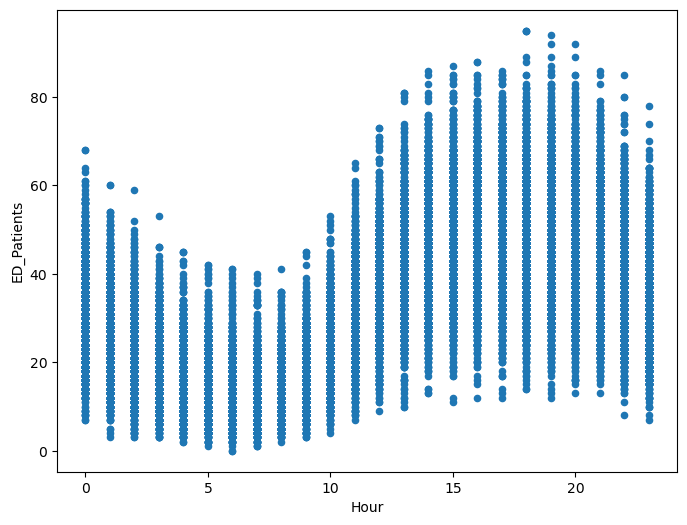

In [33]:
erv_df.plot.scatter(x='Hour',y='ED_Patients')

In [34]:
from statsmodels.tsa.seasonal import seasonal_decompose


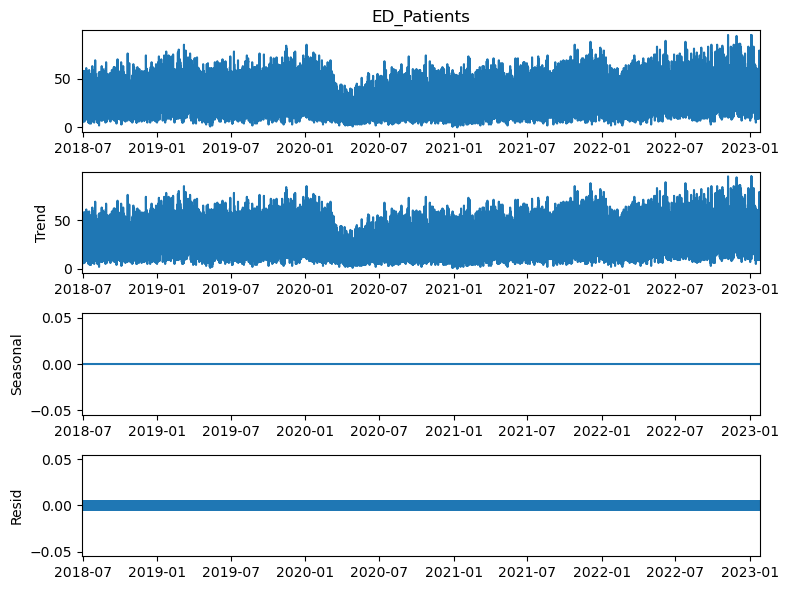

In [35]:
result = seasonal_decompose(erv_df['ED_Patients'],period=1)
fig = result.plot()

In [51]:
erv_df_unindexed

,date_hour,Date,Hour,ED_Patients
0,2018-06-29 00:00:00,2018-06-29,0,23.0
1,2018-06-29 01:00:00,2018-06-29,1,20.0
2,2018-06-29 02:00:00,2018-06-29,2,16.0
3,2018-06-29 03:00:00,2018-06-29,3,6.0
4,2018-06-29 04:00:00,2018-06-29,4,4.0
...,...,...,...,...
39833,2023-01-26 05:00:00,2023-01-26,5,16.0
39834,2023-01-26 06:00:00,2023-01-26,6,19.0
39835,2023-01-26 07:00:00,2023-01-26,7,16.0
39836,2023-01-26 08:00:00,2023-01-26,8,21.0


In [60]:
erv_df.loc['2022-06-01':]

,Date,Hour,ED_Patients
date_hour,,,
2022-06-01 00:00:00,2022-06-01,0,56.0
2022-06-01 01:00:00,2022-06-01,1,50.0
2022-06-01 02:00:00,2022-06-01,2,42.0
2022-06-01 03:00:00,2022-06-01,3,33.0
2022-06-01 04:00:00,2022-06-01,4,30.0
...,...,...,...
2023-01-26 05:00:00,2023-01-26,5,16.0
2023-01-26 06:00:00,2023-01-26,6,19.0
2023-01-26 07:00:00,2023-01-26,7,16.0


In [110]:
from prophet import Prophet
model = Prophet()
erv_df_sliced = erv_df.loc['2022-10-01':]
train_df = erv_df_sliced.rename(columns={"ED_Patients":'y'})
train_df["ds"] = train_df.index
model.fit(train_df)

13:57:42 - cmdstanpy - INFO - Chain [1] start processing
13:57:43 - cmdstanpy - INFO - Chain [1] done processing


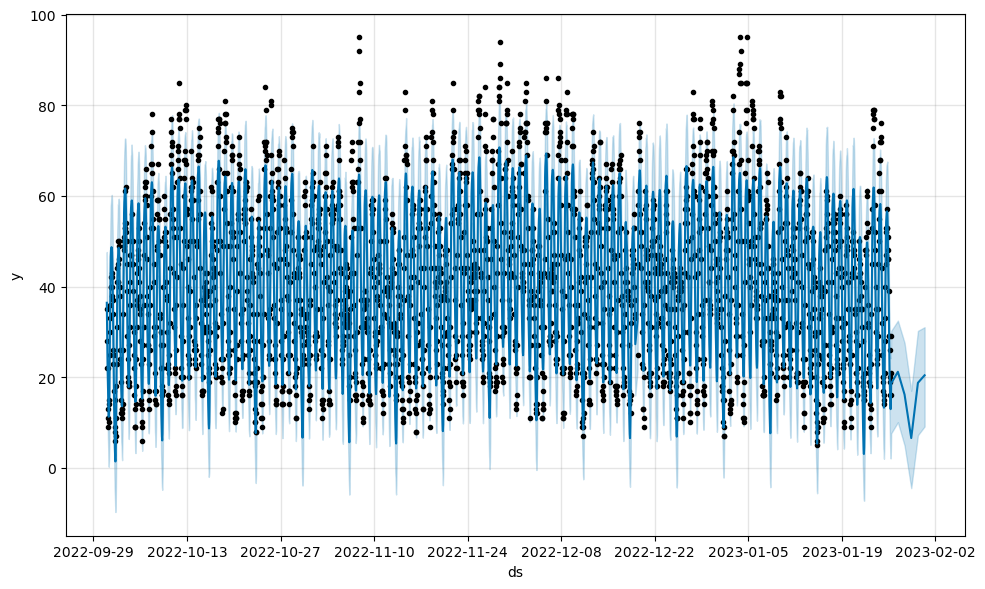

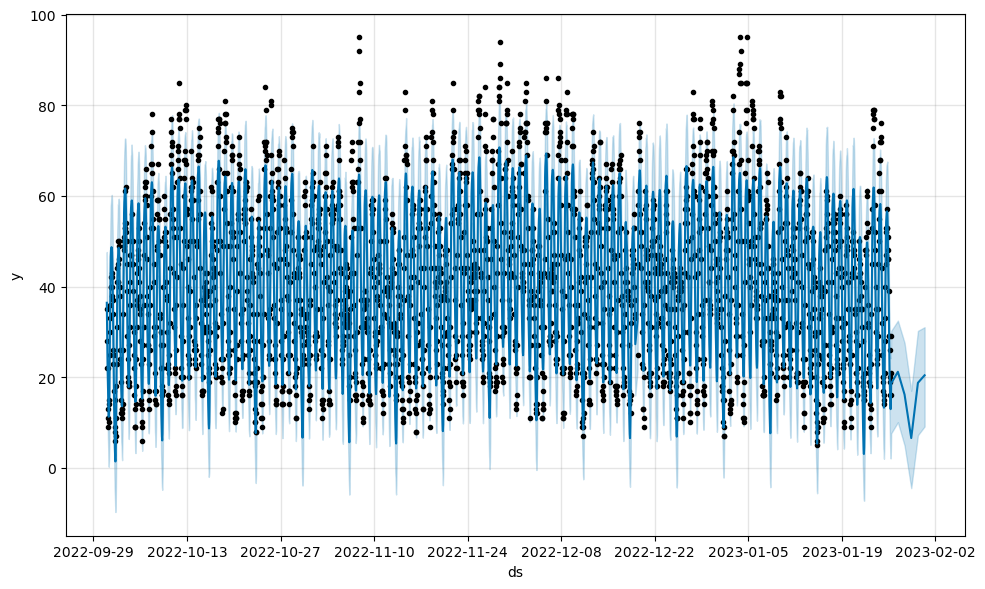

In [111]:
pd.plotting.register_matplotlib_converters()

# We want to forecast over the next 5 months
future = model.make_future_dataframe(5, freq='D', include_history=True)
forecast = model.predict(future)
model.plot(forecast)

In [101]:
one_month = forecast.loc[forecast['ds'] > '20230122']
one_month

,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,daily,daily_lower,daily_upper,weekly,weekly_lower,weekly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
5615,2023-01-22 01:00:00,38.781436,13.677147,36.754970,38.781436,38.781436,-13.810306,-13.810306,-13.810306,-5.818498,-5.818498,-5.818498,-7.991808,-7.991808,-7.991808,0.0,0.0,0.0,24.971130
5616,2023-01-22 02:00:00,38.777253,8.635324,31.659379,38.777253,38.777253,-18.731457,-18.731457,-18.731457,-10.529384,-10.529384,-10.529384,-8.202074,-8.202074,-8.202074,0.0,0.0,0.0,20.045796
5617,2023-01-22 03:00:00,38.773071,4.688828,27.400980,38.773071,38.773071,-22.714638,-22.714638,-22.714638,-14.345783,-14.345783,-14.345783,-8.368855,-8.368855,-8.368855,0.0,0.0,0.0,16.058432
5618,2023-01-22 04:00:00,38.768888,1.924504,23.796814,38.768888,38.768888,-25.887439,-25.887439,-25.887439,-17.397169,-17.397169,-17.397169,-8.490270,-8.490270,-8.490270,0.0,0.0,0.0,12.881449
5619,2023-01-22 05:00:00,38.764705,-0.973940,21.274285,38.764705,38.764705,-28.500119,-28.500119,-28.500119,-19.935299,-19.935299,-19.935299,-8.564820,-8.564820,-8.564820,0.0,0.0,0.0,10.264586
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5720,2023-01-27 09:00:00,38.246064,11.143991,33.262916,38.246064,38.246064,-15.982025,-15.982025,-15.982025,-17.355518,-17.355518,-17.355518,1.373493,1.373493,1.373493,0.0,0.0,0.0,22.264040
5721,2023-01-28 09:00:00,38.145682,7.438641,30.920218,38.145682,38.146834,-18.658403,-18.658403,-18.658403,-17.355518,-17.355518,-17.355518,-1.302885,-1.302885,-1.302885,0.0,0.0,0.0,19.487279
5722,2023-01-29 09:00:00,38.045300,1.619910,24.502337,38.032868,38.059679,-25.734188,-25.734188,-25.734188,-17.355518,-17.355518,-17.355518,-8.378670,-8.378670,-8.378670,0.0,0.0,0.0,12.311112
5723,2023-01-30 09:00:00,37.944918,12.425724,34.536033,37.913375,37.974376,-14.539167,-14.539167,-14.539167,-17.355518,-17.355518,-17.355518,2.816350,2.816350,2.816350,0.0,0.0,0.0,23.405751


<AxesSubplot: xlabel='ds'>

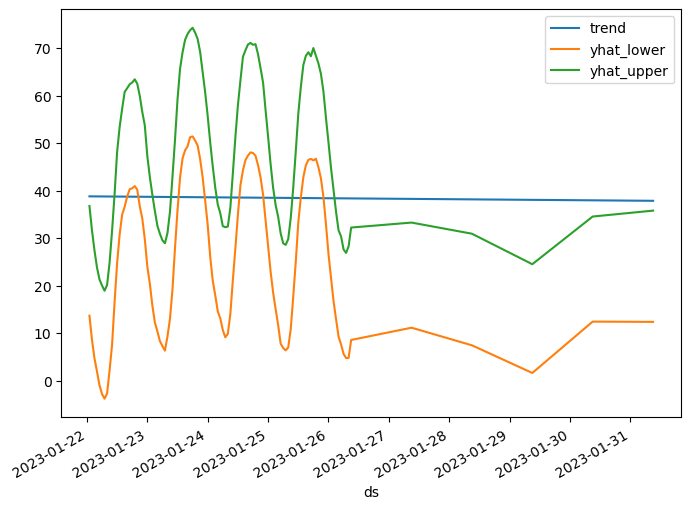

In [102]:
one_month.plot(x='ds',y=['trend','yhat_lower','yhat_upper'])

In [103]:
one_month.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 110 entries, 5615 to 5724
Data columns (total 19 columns):
 #   Column                      Non-Null Count  Dtype         
---  ------                      --------------  -----         
 0   ds                          110 non-null    datetime64[ns]
 1   trend                       110 non-null    float64       
 2   yhat_lower                  110 non-null    float64       
 3   yhat_upper                  110 non-null    float64       
 4   trend_lower                 110 non-null    float64       
 5   trend_upper                 110 non-null    float64       
 6   additive_terms              110 non-null    float64       
 7   additive_terms_lower        110 non-null    float64       
 8   additive_terms_upper        110 non-null    float64       
 9   daily                       110 non-null    float64       
 10  daily_lower                 110 non-null    float64       
 11  daily_upper                 110 non-null    float64   

In [104]:
one_month.set_index('ds').resample('H')

In [105]:
one_month.set_index('ds')

,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,daily,daily_lower,daily_upper,weekly,weekly_lower,weekly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
ds,,,,,,,,,,,,,,,,,,
2023-01-22 01:00:00,38.781436,13.677147,36.754970,38.781436,38.781436,-13.810306,-13.810306,-13.810306,-5.818498,-5.818498,-5.818498,-7.991808,-7.991808,-7.991808,0.0,0.0,0.0,24.971130
2023-01-22 02:00:00,38.777253,8.635324,31.659379,38.777253,38.777253,-18.731457,-18.731457,-18.731457,-10.529384,-10.529384,-10.529384,-8.202074,-8.202074,-8.202074,0.0,0.0,0.0,20.045796
2023-01-22 03:00:00,38.773071,4.688828,27.400980,38.773071,38.773071,-22.714638,-22.714638,-22.714638,-14.345783,-14.345783,-14.345783,-8.368855,-8.368855,-8.368855,0.0,0.0,0.0,16.058432
2023-01-22 04:00:00,38.768888,1.924504,23.796814,38.768888,38.768888,-25.887439,-25.887439,-25.887439,-17.397169,-17.397169,-17.397169,-8.490270,-8.490270,-8.490270,0.0,0.0,0.0,12.881449
2023-01-22 05:00:00,38.764705,-0.973940,21.274285,38.764705,38.764705,-28.500119,-28.500119,-28.500119,-19.935299,-19.935299,-19.935299,-8.564820,-8.564820,-8.564820,0.0,0.0,0.0,10.264586
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2023-01-27 09:00:00,38.246064,11.143991,33.262916,38.246064,38.246064,-15.982025,-15.982025,-15.982025,-17.355518,-17.355518,-17.355518,1.373493,1.373493,1.373493,0.0,0.0,0.0,22.264040
2023-01-28 09:00:00,38.145682,7.438641,30.920218,38.145682,38.146834,-18.658403,-18.658403,-18.658403,-17.355518,-17.355518,-17.355518,-1.302885,-1.302885,-1.302885,0.0,0.0,0.0,19.487279
2023-01-29 09:00:00,38.045300,1.619910,24.502337,38.032868,38.059679,-25.734188,-25.734188,-25.734188,-17.355518,-17.355518,-17.355518,-8.378670,-8.378670,-8.378670,0.0,0.0,0.0,12.311112


In [106]:
one_month.tail(20)

,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,daily,daily_lower,daily_upper,weekly,weekly_lower,weekly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
5705,2023-01-25 19:00:00,38.405003,46.701232,68.374362,38.405003,38.405003,19.266507,19.266507,19.266507,18.107694,18.107694,18.107694,1.158812,1.158812,1.158812,0.0,0.0,0.0,57.671509
5706,2023-01-25 20:00:00,38.400820,44.905515,66.755957,38.400820,38.400820,17.657867,17.657867,17.657867,16.570838,16.570838,16.570838,1.087029,1.087029,1.087029,0.0,0.0,0.0,56.058688
5707,2023-01-25 21:00:00,38.396638,42.569404,64.549551,38.396638,38.396638,14.851062,14.851062,14.851062,13.843117,13.843117,13.843117,1.007946,1.007946,1.007946,0.0,0.0,0.0,53.247700
5708,2023-01-25 22:00:00,38.392455,38.611025,60.811887,38.392455,38.392455,10.832457,10.832457,10.832457,9.910539,9.910539,9.910539,0.921918,0.921918,0.921918,0.0,0.0,0.0,49.224912
5709,2023-01-25 23:00:00,38.388272,32.879164,55.270482,38.388272,38.388272,5.819465,5.819465,5.819465,4.989975,4.989975,4.989975,0.829490,0.829490,0.829490,0.0,0.0,0.0,44.207737
5710,2023-01-26 00:00:00,38.384090,26.624158,50.114068,38.384090,38.384090,0.272091,0.272091,0.272091,-0.459295,-0.459295,-0.459295,0.731386,0.731386,0.731386,0.0,0.0,0.0,38.656181
5711,2023-01-26 01:00:00,38.379907,21.683107,44.758114,38.379907,38.379907,-5.189998,-5.189998,-5.189998,-5.818498,-5.818498,-5.818498,0.628500,0.628500,0.628500,0.0,0.0,0.0,33.189909
5712,2023-01-26 02:00:00,38.375725,16.763021,40.192024,38.375725,38.375725,-10.007501,-10.007501,-10.007501,-10.529384,-10.529384,-10.529384,0.521882,0.521882,0.521882,0.0,0.0,0.0,28.368223
5713,2023-01-26 03:00:00,38.371542,12.961551,35.542694,38.371542,38.371542,-13.933060,-13.933060,-13.933060,-14.345783,-14.345783,-14.345783,0.412723,0.412723,0.412723,0.0,0.0,0.0,24.438482
5714,2023-01-26 04:00:00,38.367359,9.256429,31.633401,38.367359,38.367359,-17.094832,-17.094832,-17.094832,-17.397169,-17.397169,-17.397169,0.302337,0.302337,0.302337,0.0,0.0,0.0,21.272528


<AxesSubplot: xlabel='ds'>

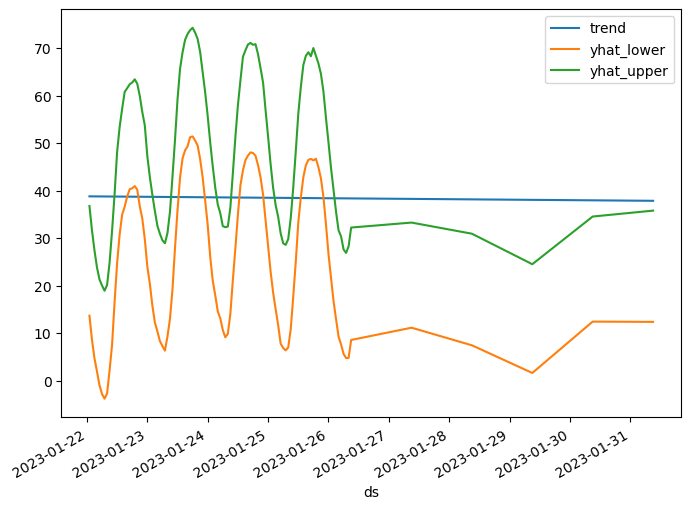

In [107]:
one_month.plot(x='ds',y=['trend','yhat_lower','yhat_upper'])